#PROYECTO FINAL INTEGRADOR

## Dataset: Financial Inclusion Africa
 ---
#### Integrantes
- Atienza Rela, Macarena
- Paulisich Bustelo, Alejo  
- Di Lelle, Alejo
- Fernandez Ferreyra, Mariano

 ---

En el siguiente enlace van a encontrar todos los archivos utilizados para este trabajo.

Link a repositorio de Github: https://github.com/adilelle1/financial_inclusion_africa

 ---


# Problemática

La inclusión financiera refiere al acceso que tienen las personas y las empresas a diversos productos y servicios financieros útiles y asequibles que atienden sus necesidades. Representa una preocupación global, ya que se considera como elemento facilitador para reducir la pobreza extrema y promover el crecimiento y desarrollo económico.


El acceso a cuentas bancarias, impacta tanto en el desarrollo humano, como en el ámbito económico, ya que permite a los hogares ahorrar, realizar pagos, acceder a créditos, financiamiento, entre otros; al mismo tiempo que ayuda a las empresas a aumentar su solvencia crediticia y mejorar su acceso a préstamos, seguros y servicios relacionados. 


En África, la incusión financiera constituye uno de los principales problemas, ya que en una población compuesta de alrededor de 172,19 millones de personas (The World Bank Group , 2020) en 4 países (Kenia, Ruanda, Tanzania y Uganda), solo el 14% de la población adulta, representada por 9,1 millones, tiene este acceso (Zindi).


Por esta razón, la Nueva Alianza para el Desarrollo de África (NEPAD) ha involucrado a representantes del continente para encontrar soluciones que podrían mejorar la inclusión financiera y el bienestar de las personas que viven en África, utilizando el modelo empresarial cooperativo.

# Objetivo



La presente notebook propone crear un modelo para predecir qué individuos tienen más probabilidades de tener acceso a una cuenta bancaria.

# Instalación e importación de librerías

In [2]:
#Estas son las librerias que vamos a utilizar para el analisis de los datos
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import KFold
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
import pickle
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import plotly.express as px


# Importación y exploración del dataset

El conjunto de datos utilizado, ha sido extraído de Zindi, una red profesional para científicos de datos en África; constituyen los resultados de las encuestas de Finscope de 2016 a 2018.

Su contenido principal está relacionado con la información demográfica y servicios financieros utilizados por aproximadamente 23.500 personas en África, correspondientes a 4 países: Kenia, Ruanda, Tanzania y Uganda.

In [3]:
df = pd.read_csv('Train.csv')
df.drop(columns=['uniqueid', 'year'],inplace=True)


In [4]:
# Hacemos una copia porque vamos a ir encodeando variables para graficarlas, pero luego haremos todo el preprocesamiento en el Pipeline.
data = df.copy()
data

,country,bank_account,location_type,cellphone_access,household_size,age_of_respondent,gender_of_respondent,relationship_with_head,marital_status,education_level,job_type
0,Kenya,Yes,Rural,Yes,3,24,Female,Spouse,Married/Living together,Secondary education,Self employed
1,Kenya,No,Rural,No,5,70,Female,Head of Household,Widowed,No formal education,Government Dependent
2,Kenya,Yes,Urban,Yes,5,26,Male,Other relative,Single/Never Married,Vocational/Specialised training,Self employed
3,Kenya,No,Rural,Yes,5,34,Female,Head of Household,Married/Living together,Primary education,Formally employed Private
4,Kenya,No,Urban,No,8,26,Male,Child,Single/Never Married,Primary education,Informally employed
...,...,...,...,...,...,...,...,...,...,...,...
23519,Uganda,No,Rural,Yes,4,48,Female,Head of Household,Divorced/Seperated,No formal education,Other Income
23520,Uganda,No,Rural,Yes,2,27,Female,Head of Household,Single/Never Married,Secondary education,Other Income
23521,Uganda,No,Rural,Yes,5,27,Female,Parent,Widowed,Primary education,Other Income
23522,Uganda,No,Urban,Yes,7,30,Female,Parent,Divorced/Seperated,Secondary education,Self employed


## Descripción de las columnas

Observamos que no es necesario cambiar el nombre de nuestras columnas, ya que resultan inteligibles.

**country :** País de residencia del encuestado <br />
**bank_account :** Si posee cuenta de banco o no<br />
**location_type :** Si vive en zona rural o urbana<br />
**cellphone_access :** Si tiene acceso a teléfono móvil<br />
**household_size :** Cantidad de personas que viven en el hogar <br />
**age_of_respondent :** Edad de la persona encuestada<br />
**gender_of_respondent :** Género de la persona (Male, Female)<br />
**relationship_with_head :** Relación con el responsable de la casa (Head of Household, Spouse, Child, Parent, Other relative, Other non-relatives, Dont )<br />
**marital_status :** Estado civil de la persona encuestada (Married/Living together, Divorced/Seperated, Widowed, Single/Never Married, Dont know)<br />
**education_level :** Nivel de educación (No formal education, Primary education, Secondary education, Vocational/Specialised training, Tertiary education, Other/Dont)<br /> 
**job_type :** Tipo de trabajo del encuestado (Farming and Fishing, Self employed, Formally employed Government, Formally employed Private, Informally employed, Remittance Dependent, Government Dependent, Other Income, No Income, Dont Know/Refuse to answer)

In [5]:
data.columns

Index(['country', 'bank_account', 'location_type', 'cellphone_access',
       'household_size', 'age_of_respondent', 'gender_of_respondent',
       'relationship_with_head', 'marital_status', 'education_level',
       'job_type'],
      dtype='object')

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23524 entries, 0 to 23523
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   country                 23524 non-null  object
 1   bank_account            23524 non-null  object
 2   location_type           23524 non-null  object
 3   cellphone_access        23524 non-null  object
 4   household_size          23524 non-null  int64 
 5   age_of_respondent       23524 non-null  int64 
 6   gender_of_respondent    23524 non-null  object
 7   relationship_with_head  23524 non-null  object
 8   marital_status          23524 non-null  object
 9   education_level         23524 non-null  object
 10  job_type                23524 non-null  object
dtypes: int64(2), object(9)
memory usage: 2.0+ MB


Vemos que el conjunto de datos contiene nueve (9) columnas que son de tipo objeto, es decir que contienen valores string (variables categóricas), y dos (2) columnas que se componen por números enteros (variables continuas). Ésto indica que debemos trabajar en el tipo de datos.


In [7]:
data.isnull().sum()

country                   0
bank_account              0
location_type             0
cellphone_access          0
household_size            0
age_of_respondent         0
gender_of_respondent      0
relationship_with_head    0
marital_status            0
education_level           0
job_type                  0
dtype: int64

Ninguna columna presenta valores faltantes

## Análisis univariado

Realizamos un análisis para saber cómo se comportan cada una de las variables por separado. 

In [8]:
# Comenzamos definiendo algunas funciones para visualizar los datos a partir de la construcción de gráficos.

# Histograma.
def graf_hist(column, nombre_columna):
  fig = px.histogram(data, x= column, color= column, color_discrete_sequence=px.colors.qualitative.Set2).update_xaxes(categoryorder='total descending',)
  fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    bargap= 0.2,
    title={
        'text': (f'Distribución: {nombre_columna}'),
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
  
    showlegend=False,
    font=dict(size=18)
    )
  fig.show()

# Pie charts
def graf_pie(column, nombre_columna):

  fig = px.pie(data, names= column, color_discrete_sequence=px.colors.qualitative.Set2, hole=.5)
  fig.update_layout(
    autosize=False,
    width=800,
    height=400,
    title={
        'text': (f'Proporciones: {nombre_columna}'),
        'y':0.95,
        'x':0.01},
    legend_title= None,
    font=dict(size=18)
    )

  fig.show()

### País

In [9]:
data.country.value_counts()

Rwanda      8735
Tanzania    6620
Kenya       6068
Uganda      2101
Name: country, dtype: int64

In [10]:
# Comenzamos una lista con las features categóricas para luego encodearlas.
categorical_cols = ['country']

In [11]:
graf_hist('country', 'country')

El gráfico muestra que la mayoría de los encuestados provienen de Ruanda (8735), siendo la minoría aquellos provenientes de Uganda (2101).

### Cuenta bancaria == Target

La columna bank_account será nuestra variable target, ya que el objetivo es predecir la probabilidad de que un individuo tenga acceso a una cuenta bancaria, según la edad, el nivel de educación, el año, el estado civil, el acceso al teléfono celular, la ubicación, el tipo de trabajo, etc.


In [12]:
data.bank_account.value_counts()

No     20212
Yes     3312
Name: bank_account, dtype: int64

In [13]:
graf_hist('bank_account','cuenta bancaria')

In [14]:
graf_pie('bank_account','cuenta bancaria')

Los gráficos nos permiten ver que las clases de nuestra variable target, no están bien equilibradas, sino que presentan un gran desbalance, siendo la mayoría de los encuestados aquellos que no poseen acceso a una cuenta bancaria. 

### Tipo de locacion

In [15]:
data.location_type.value_counts()

Rural    14343
Urban     9181
Name: location_type, dtype: int64

In [16]:
# vamos agregando las columnas categoricas a una lista para luego convertirlas a dummies
categorical_cols.append('location_type')

In [17]:
graf_hist('location_type','zonas')

In [18]:
graf_pie('location_type','zona (rural/urbana)')

Los gráficos muestran que la mayoría de los encuestados provienen del área rural (más de 14000) y pocos de ellos se encuentran en zonas urbanas (aproximadamente 9000).


### Acceso a telefono movil

In [19]:
data.cellphone_access.value_counts()

Yes    17454
No      6070
Name: cellphone_access, dtype: int64

In [20]:
categorical_cols.append('cellphone_access')

In [21]:
graf_hist('cellphone_access','acceso a teléfono celular')

In [22]:
graf_pie('cellphone_access','acceso a teléfono celular')

El gráfico muestra que la mayoría de los encuestados poseen teléfonos celulares. Sin embargo, son más de 6000 las personas que no cuentan con esta tecnología.


### Cantidad de personas por hogar

In [23]:
data.household_size.value_counts()

2     5229
3     3920
4     3474
1     3057
5     2853
6     2096
7     1400
8      751
9      363
10     190
11      69
12      68
13      25
15      11
14      10
16       4
21       1
18       1
17       1
20       1
Name: household_size, dtype: int64

C:\Users\alejo\AppData\Local\Temp\ipykernel_8232\3188200633.py:3: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




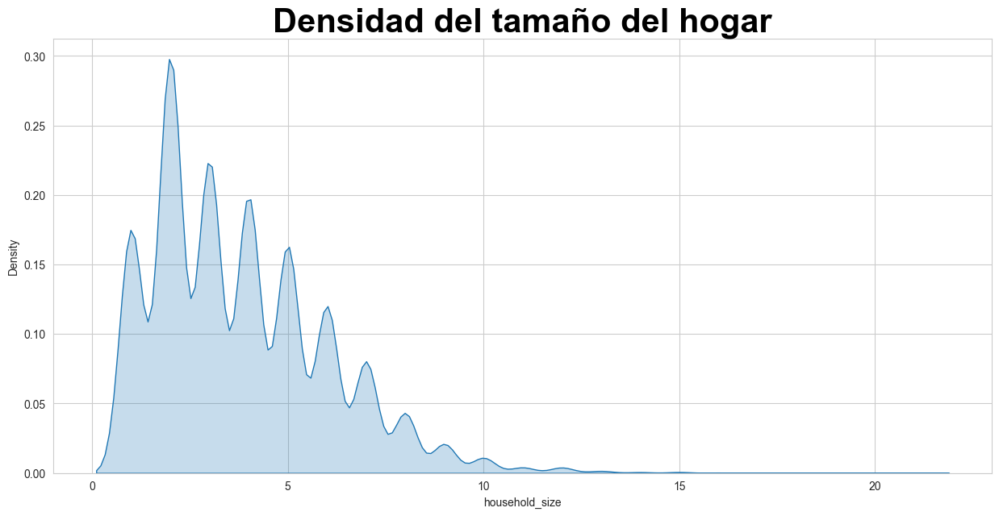

In [24]:
fig = plt.figure(figsize=(15,7))
sns.set_style('whitegrid')
sns.kdeplot(data=data, x='household_size', shade=True).set_title("Densidad del tamaño del hogar",
                  fontdict = {'fontsize': 30,       
                              'fontweight': 'bold',
                              'color': 'black'})      
plt.show()

In [25]:
fig = px.box(df, x="household_size")
fig.update_layout(
    autosize=False,
    width=800,
    height=400,
    title={
        'text': ('Boxplot: Tamaño del hogar'),
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(size=18)
    )
fig.show()

A partir de los gráficos observamos que el tamaño del hogar no se distribuye normalmente, y que el número más común de personas que viven por casa es de 2 a 5.


### Edad

In [26]:
data.age_of_respondent.value_counts()

30     1056
35      836
25      792
28      748
32      715
       ... 
100       5
93        4
96        3
99        2
97        1
Name: age_of_respondent, Length: 85, dtype: int64

C:\Users\alejo\AppData\Local\Temp\ipykernel_8232\3037877969.py:3: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




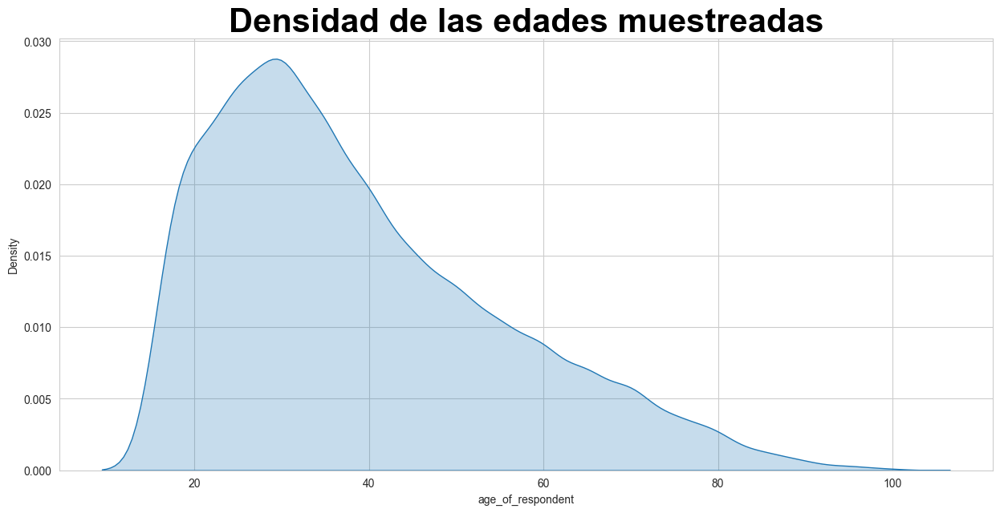

In [27]:
fig = plt.figure(figsize=(15,7))
sns.set_style('whitegrid')
sns.kdeplot(data=data, x='age_of_respondent', shade=True).set_title("Densidad de las edades muestreadas",
                  fontdict = {'fontsize': 30,       
                              'fontweight': 'bold',
                              'color': 'black'})      
plt.show()

In [28]:
fig = px.box(df, x="age_of_respondent")
fig.update_layout(
    autosize=False,
    width=800,
    height=400,
    title={
        'text': ('Boxplot: Edades'),
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(size=18)
    )
fig.show()


La mayoría de los encuestados de nuestro conjunto de datos tienen entre 26 y 49 años; la edad máxima es de 100 años y la mínima de 16 años; el promedio se encuentra en los 35 años.

### Género (F/M)

In [29]:
data.gender_of_respondent.value_counts()

Female    13877
Male       9647
Name: gender_of_respondent, dtype: int64

In [30]:
categorical_cols.append('gender_of_respondent')

In [31]:
graf_hist('gender_of_respondent','género')

In [32]:
graf_pie('gender_of_respondent','género')

Vemos que la mayor parte del conjunto de datos recopilados son de mujeres, que se acercan a los 14000 registros (casi el 60% de los datos). 


### Relación con el responsable del hogar

In [33]:
data.relationship_with_head.value_counts()

Head of Household      12831
Spouse                  6520
Child                   2229
Parent                  1086
Other relative           668
Other non-relatives      190
Name: relationship_with_head, dtype: int64

In [34]:
categorical_cols.append('relationship_with_head')

In [35]:
graf_hist('relationship_with_head', 'Relación con responsable del hogar')

Vemos que los principales encuestados corresponden al principal sostén del hogar (12831), seguidos por cónyugue; mientras que la minoría son aquellos que no poseen una relación familiar con el responsable del hogar. 

### Estado civil

In [36]:
data.marital_status.value_counts()

Married/Living together    10749
Single/Never Married        7983
Widowed                     2708
Divorced/Seperated          2076
Dont know                      8
Name: marital_status, dtype: int64

In [37]:
categorical_cols.append('marital_status')

In [38]:
graf_hist('marital_status', 'Estado civil')

El gráfico muestra que la mayoría de las personas encuestadas estaban casadas, seguidas por personas solteras; mientras que la minoría respondió que no sabía.

###  Nivel educativo

In [39]:
data.education_level.value_counts()

Primary education                  12791
No formal education                 4515
Secondary education                 4223
Tertiary education                  1157
Vocational/Specialised training      803
Other/Dont know/RTA                   35
Name: education_level, dtype: int64

In [40]:
categorical_cols.append('education_level')

In [41]:
graf_hist('education_level', 'Nivel educativo')

La mayor parte de las personas encuestadas respondieron que su máximo nivel educativo alcanzado es el de Educación Primaria (12791), mientras que la minoría corresponde a aquellas personas que cuentan con una formación profesional especializada (803) u otras (35). 

### Tipo de empleo

In [42]:
data.job_type.value_counts()

Self employed                   6437
Informally employed             5597
Farming and Fishing             5441
Remittance Dependent            2527
Other Income                    1080
Formally employed Private       1055
No Income                        627
Formally employed Government     387
Government Dependent             247
Dont Know/Refuse to answer       126
Name: job_type, dtype: int64

In [43]:
1080 + 1055 + 627+387+247+126


3522

In [44]:
categorical_cols.append('job_type')

In [45]:

graf_hist('job_type','Tipo de trabajo')

El gráfico muestra que la mayoría de los encuestados trabajan por cuenta propia (6437), seguidos de los trabajadores informales (5597) y agricultores (5441); en cuarto lugar se encuentran aquellos que reciben algún tipo de subseidio por parte del estado (2527), mientras que el resto (3522) corresponde a otro tipo de empleo o ingreso. 

## Análisis bivariado

In [46]:
# Definimos función para graficar histogramas
def graf_hist2(acolumn, bcolumn):
  fig = px.histogram(data, x= acolumn, color= bcolumn, barmode='group', color_discrete_sequence=px.colors.qualitative.Set2).update_xaxes(categoryorder='total descending',)
  fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    bargap= 0.2,
    title={
        'text': (f'{acolumn} por {bcolumn}'),
        'y':0.97,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
  
    legend_title= None,
    font=dict(size=18)
    )
  fig.show()

### Cuenta bancaria por país

In [47]:
graf_hist2('bank_account','country')

#### Cuenta bancaria por tipo de locación

In [48]:
graf_hist2('bank_account','location_type')

### Cuenta bancaria por acceso a celular

In [49]:
graf_hist2('bank_account','cellphone_access')

### Cuenta bancaria por personas en el hogar

In [50]:
data.groupby('bank_account')['household_size'].mean()

bank_account
No     3.823026
Yes    3.641606
Name: household_size, dtype: float64

In [51]:
data.groupby('bank_account')[u'household_size'].value_counts()

bank_account  household_size
No            2                 4610
              3                 3361
              4                 2973
              1                 2473
              5                 2426
              6                 1819
              7                 1223
              8                  665
              9                  326
              10                 165
              11                  63
              12                  61
              13                  23
              15                   9
              14                   8
              16                   4
              18                   1
              20                   1
              21                   1
Yes           2                  619
              1                  584
              3                  559
              4                  501
              5                  427
              6                  277
              7                  177
         

### Cuenta bancaria por edad

In [52]:
data.groupby('bank_account')['age_of_respondent'].mean()

bank_account
No     38.675292
Yes    39.598128
Name: age_of_respondent, dtype: float64

In [53]:
data.groupby('bank_account')['age_of_respondent'].median()

bank_account
No     35.0
Yes    36.0
Name: age_of_respondent, dtype: float64

In [54]:
data.groupby('bank_account')['age_of_respondent'].value_counts()

bank_account  age_of_respondent
No            30                   879
              35                   700
              25                   675
              28                   623
              20                   590
                                  ... 
Yes           88                     2
              87                     1
              89                     1
              90                     1
              93                     1
Name: age_of_respondent, Length: 162, dtype: int64

### Cuenta bancaria por género

In [55]:
graf_hist2('bank_account','gender_of_respondent')

### Cuenta bancaria por relación con responsable hogar

In [56]:
graf_hist2('bank_account','relationship_with_head')

### Cuenta bancaria por estado civil

In [57]:
graf_hist2('bank_account','marital_status')

### Cuenta bancaria por nivel educativo

In [58]:
graf_hist2('bank_account','education_level')

### Cuenta bancaria por tipo de empleo

In [59]:
graf_hist2('bank_account','job_type')

## Análisis multivariado

### Rango etario y zona (rural/urbana)

Podemos ver según el rango de edad de las personas, cuáles viven en zona rural o urbana.

In [60]:
# Establecemos las categorías.
categories_persons = pd.qcut(data.age_of_respondent, 4, labels=["adolescente", "adulto", "adulto/mayor", "anciano"])
# Asignamos los intervalos.
categories_persons_age  = pd.cut(data.age_of_respondent, [16, 30, 60, 100])
# Construimos tabla pivot para observar los resultados.
data.pivot_table('bank_account',['location_type',categories_persons_age],[categories_persons],
                    fill_value='No existen', aggfunc={'bank_account':'count'})

age_of_respondent                adolescente  adulto  adulto/mayor  anciano
location_type age_of_respondent                                            
Rural         (16, 30]                  3289    1714             0        0
              (30, 60]                     0    1920          3415     1878
              (60, 100]                    0       0             0     1846
Urban         (16, 30]                  2465    1177             0        0
              (30, 60]                     0    1147          2192     1027
              (60, 100]                    0       0             0      992

### Correlación de las variables binarias


In [61]:
# Encodeamos las variables, facilitando un mejor análisis de las mismas
binary_encoder = OneHotEncoder(sparse=False, drop='if_binary')
data_encod = pd.DataFrame()
data_encod['bank_account'], data_encod['location_type'], data_encod['cellphone_access'], data_encod['gender_of_respondent'] = binary_encoder.fit_transform(data[['bank_account','location_type', 'cellphone_access','gender_of_respondent']]).T

#data_encod['household_size'], data_encod['age_of_respondent'] = data['household_size'],data['age_of_respondent']
data_encod

c:\Users\alejo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_encoders.py:828: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



,bank_account,location_type,cellphone_access,gender_of_respondent
0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0
2,1.0,1.0,1.0,1.0
3,0.0,0.0,1.0,0.0
4,0.0,1.0,0.0,1.0
...,...,...,...,...
23519,0.0,0.0,1.0,0.0
23520,0.0,0.0,1.0,0.0
23521,0.0,0.0,1.0,0.0
23522,0.0,1.0,1.0,0.0


In [62]:
# Construimos matriz de correlación para que tener  noción de qué columnas tienen mayor dependencia entre sí.
fig = px.imshow(data_encod.corr(), text_auto=True, aspect="auto", color_continuous_scale='darkmint').update_xaxes(tickangle=45)
fig.update_layout(
    autosize=False,
    width=1200,
    height=800,
    bargap=0.2,
    title={
        'text': ('Heatmap: Variables numéricas'),
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, 
    showlegend=False,
    font=dict(size=15)
    )


fig.show()

Observamos que nuestra variable target tiene mayor dependencia con las variables que corresponden al acceso de teléfono celular, en primer lugar, y al género de la persona, en segundo. 

## Conclusiones del análisis

Al realizar el análisis de distribuciones y correlación, fue posible observar que:

*   Kenya es el país con mayor registro de bancarización.
*   Existe una diferencia sustancial entre el tipo de locación (zona rural/urbana) de la persona cuando se trata de no tener acceso al banco. Sin embargo,ésto no se repite para quienes sí tienen cuenta. 
* Cuando se trata del género de la persona encuestada, se observa un comportamiento similar al susodicho. 
*   La edad media de las personas bancarizadas es de 39,59 años, la de aquellas personas que no poseen cuenta, es de 38,67; la mediana, es de 36 y 35.
*   Dentro de las variables, la que tiene mayor correlación con la columna target, es la que refiere al acceso de teléfono celular, con un valor de 0.209669; hecho que se explicita al observar la distribución de personas con acceso a celular en relación a estar bancarizadas.

# Limpieza y transformación de datos

## Encoding

### Variable target

In [63]:
binary_encoder = OneHotEncoder(sparse=False, drop='if_binary')
data['bank_account']= binary_encoder.fit_transform(data[['bank_account']])
df['bank_account']= binary_encoder.fit_transform(df[['bank_account']])

data[['bank_account']].head()

c:\Users\alejo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_encoders.py:828: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.

c:\Users\alejo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_encoders.py:828: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



,bank_account
0,1.0
1,0.0
2,1.0
3,0.0
4,0.0


### Variables categoricas

In [64]:
# Verificamos la lista de columnas
categorical_cols

['country',
 'location_type',
 'cellphone_access',
 'gender_of_respondent',
 'relationship_with_head',
 'marital_status',
 'education_level',
 'job_type']

In [65]:
for col in categorical_cols:
    dummy_table = pd.get_dummies(data[col], drop_first= True,prefix = col)
    data = pd.concat([data, dummy_table], axis=1)
    data.drop(columns=col, inplace=True)

In [66]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23524 entries, 0 to 23523
Data columns (total 32 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   bank_account                                     23524 non-null  float64
 1   household_size                                   23524 non-null  int64  
 2   age_of_respondent                                23524 non-null  int64  
 3   country_Rwanda                                   23524 non-null  uint8  
 4   country_Tanzania                                 23524 non-null  uint8  
 5   country_Uganda                                   23524 non-null  uint8  
 6   location_type_Urban                              23524 non-null  uint8  
 7   cellphone_access_Yes                             23524 non-null  uint8  
 8   gender_of_respondent_Male                        23524 non-null  uint8  
 9   relationship_with_head_Head 

In [67]:
# varianza de cada columna luego de transformarlas
data.apply(np.var).sort_values(ascending=False)

age_of_respondent                                  272.917596
household_size                                       4.962048
marital_status_Married/Living together               0.248146
education_level_Primary education                    0.248087
relationship_with_head_Head of Household             0.247935
gender_of_respondent_Male                            0.241917
location_type_Urban                                  0.237962
country_Rwanda                                       0.233442
marital_status_Single/Never Married                  0.224193
country_Tanzania                                     0.202220
relationship_with_head_Spouse                        0.200344
job_type_Self employed                               0.198759
cellphone_access_Yes                                 0.191453
job_type_Informally employed                         0.181318
job_type_Farming and Fishing                         0.177798
education_level_Secondary education                  0.147292
bank_acc

# Train test split


In [68]:
X = df.drop('bank_account',axis = 1)
y = df['bank_account']

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

# Hipotesis nula - variable objetivo

In [70]:
df.bank_account.value_counts(normalize=True)

0.0    0.859208
1.0    0.140792
Name: bank_account, dtype: float64

# Modelo usando Pipeline y Grid Search

In [71]:
# creamos los pipelines de preprocesamiento para columnas numericas y categoricas por separado, y los unimos usando ColumnTransformer

# Separamos los procesamientos de las columnas categóricas y numéricas
categorical_features = [col for col in X_train.columns if X_train[col].dtype == object or X_train[col].dtype == 'category']
numeric_features = [col for col in X_train.columns if X_train[col].dtype == 'int64']

# Pipeline para cada tipo de columna con un preprocesamiento diferente
numeric_transformer = Pipeline(
    steps=[("scaler", StandardScaler())])

categorical_transformer = Pipeline(
    steps=[("encoder", OneHotEncoder(handle_unknown="ignore", drop='first'))])


# creamos el column transformer usando los pipelines de columnas categóricas y numéricas
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

## Logistic Regression


In [72]:
# Instanciamos los clasificadores
log = LogisticRegression(random_state= 42)

# Pipeline Log  
pipe = Pipeline([
  ("preprocessor", preprocessor),
  ('classifier', log)])

param_grid = [{'preprocessor__num__scaler': [StandardScaler(), MinMaxScaler()],
              'classifier': [log],
              'classifier__C': [0.001, 0.01, 0.1, 1, 10],
              'classifier__max_iter': [500, 1000],
              'classifier__penalty': ['l2','none']}]

kf = KFold(n_splits=3, shuffle = True)

# Grid Search con Cross validation
gridcv_log = GridSearchCV(pipe, param_grid, cv=kf, verbose=1, n_jobs = 7)

gridcv_log.fit(X_train, y_train)
gridcv_log.best_estimator_


Fitting 3 folds for each of 40 candidates, totalling 120 fits


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['household_size',
                                                   'age_of_respondent']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['country', 'location_type',
                                                   'cellphone_access',
                                                   'gender_of_respondent',
                                                   'relationship_with_head',
                                                   'marital_status',
                                                   'education_level',
                                                   'job_type'])])),
                ('classifier',
                 LogisticRegression(C=0.1, max_iter=500, random_state=42))])

In [73]:
print("Best hyperparameters:", gridcv_log.best_params_)

Best hyperparameters: {'classifier': LogisticRegression(C=0.1, max_iter=500, random_state=42), 'classifier__C': 0.1, 'classifier__max_iter': 500, 'classifier__penalty': 'l2', 'preprocessor__num__scaler': StandardScaler()}


In [74]:
y_pred_log = gridcv_log.predict(X_test)
log_accuracy_score = metrics.accuracy_score(y_test, y_pred_log)
log_precision_score = metrics.precision_score(y_test, y_pred_log)
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_log).ravel()
log_specificity = tn / (tn+fp)

## RandomForestClassifier

In [75]:
# Instanciamos los clasificadores
rf = RandomForestClassifier(random_state= 42)

# Pipeline RFC  
pipe = Pipeline([
  ("preprocessor", preprocessor),
  ('classifier', rf)])

param_grid = [{'preprocessor__num__scaler': [StandardScaler(), MinMaxScaler()],
              'classifier__max_depth': [3, 5, 7, None],
              'classifier__max_features': ['log2', 'sqrt'],
              'classifier__class_weight': ['balanced', 'balanced_subsample', None],
              'classifier__n_estimators': [100, 250]}]

kf = KFold(n_splits=3, shuffle = True)

# Grid Search con Cross validation
gridcv_rf = GridSearchCV(pipe, param_grid, cv=kf, verbose=1, n_jobs = 7)

gridcv_rf.fit(X_train, y_train)
gridcv_rf.best_estimator_

Fitting 3 folds for each of 96 candidates, totalling 288 fits


KeyboardInterrupt: 

In [ ]:
print("Best hyperparameters:", gridcv_rf.best_params_)

Best hyperparameters: {'classifier__class_weight': None, 'classifier__max_depth': 7, 'classifier__max_features': 'sqrt', 'classifier__n_estimators': 100, 'preprocessor__num__scaler': StandardScaler()}


In [ ]:
y_pred_rf = gridcv_rf.predict(X_test)
rf_accuracy_score = metrics.accuracy_score(y_test, y_pred_rf)
rf_precision_score = metrics.precision_score(y_test, y_pred_rf)
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_rf).ravel()
rf_specificity = tn / (tn+fp)

## AdaBoostClassifier

In [ ]:
# Instanciamos los clasificadores
ada = AdaBoostClassifier(random_state= 42)

# Pipeline ADA  
pipe = Pipeline([
  ("preprocessor", preprocessor),
  ('classifier', ada)])

param_grid = [{'preprocessor__num__scaler': [StandardScaler(), MinMaxScaler()],
              'classifier__n_estimators': [50, 100, 300],
              'classifier__learning_rate':[0.01, 0.1]}]

kf = KFold(n_splits=3, shuffle = True)

# Grid Search con Cross validation
gridcv_ada = GridSearchCV(pipe, param_grid, cv=kf, verbose=1, n_jobs = 7)

gridcv_ada.fit(X_train, y_train)
gridcv_ada.best_estimator_

Fitting 3 folds for each of 12 candidates, totalling 36 fits


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['household_size',
                                                   'age_of_respondent']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['country', 'location_type',
                                                   'cellphone_access',
                                                   'gender_of_respondent',
                                                   'relationship_with_head',
                                                   'marital_status',
                                                   'education_level',
                                                   'job_type'])])),
                ('classifier',
                 AdaBoostClassifier(learning_rate=0.1, n_estimators=300,
                                    random_state=42))])

In [ ]:
print("Best hyperparameters:", gridcv_ada.best_params_)

Best hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__n_estimators': 300, 'preprocessor__num__scaler': StandardScaler()}


In [ ]:
y_pred_ada = gridcv_ada.predict(X_test)
ada_accuracy_score = metrics.accuracy_score(y_test, y_pred_ada)
ada_precision_score = metrics.precision_score(y_test, y_pred_ada)
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_ada).ravel()
ada_specificity = tn / (tn+fp)

## GradientBoostingClassifier

In [ ]:
# Instanciamos los clasificadores
gb = GradientBoostingClassifier(random_state= 42)

# Pipeline GB  
pipe = Pipeline([
  ("preprocessor", preprocessor),
  ('classifier', gb)])

param_grid = [{'preprocessor__num__scaler': [StandardScaler(), MinMaxScaler()],
              'classifier__n_estimators': [100, 200,500],
              'classifier__learning_rate': [0.1, 0.01],
              'classifier__max_depth': [3, 5, 7]}]

kf = KFold(n_splits=3, shuffle = True)

# Grid Search con Cross validation
gridcv_gb = GridSearchCV(pipe, param_grid, cv=kf, verbose=1, n_jobs = 7)

gridcv_gb.fit(X_train, y_train)
gridcv_gb.best_estimator_

Fitting 3 folds for each of 36 candidates, totalling 108 fits


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['household_size',
                                                   'age_of_respondent']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['country', 'location_type',
                                                   'cellphone_access',
                                                   'gender_of_respondent',
                                                   'relationship_with_head',
                                                   'marital_status',
                                                   'education_level',
                                                   'job_type'])])),
                ('classifier', GradientBoostingClassifier(random_state=42))])

In [ ]:
print("Best hyperparameters:", gridcv_gb.best_params_)

Best hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__n_estimators': 100, 'preprocessor__num__scaler': StandardScaler()}


In [ ]:
y_pred_gb = gridcv_gb.predict(X_test)
gb_accuracy_score = metrics.accuracy_score(y_test, y_pred_gb)
gb_precision_score = metrics.precision_score(y_test, y_pred_gb)
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_gb).ravel()
gb_specificity = tn / (tn+fp)

## XG Boosting

In [ ]:
# Instanciamos los clasificadores
xgb = XGBClassifier(random_state= 42)

# Pipeline XGB  
pipe = Pipeline([
  ("preprocessor", preprocessor),
  ('classifier', xgb)])

param_grid = [{'preprocessor__num__scaler': [StandardScaler(), MinMaxScaler()],
              'classifier__learning_rate': [0.1, 0.01],
              'classifier__max_depth': [3, 5, 7],
              'classifier__n_estimators': [50, 100, 150],
              'classifier__gamma': [0, 0.1, 0.2]}]

kf = KFold(n_splits=3, shuffle = True)

# Grid Search con Cross validation
gridcv_xgb = GridSearchCV(pipe, param_grid, cv=kf, verbose=1, n_jobs = 7)

gridcv_xgb.fit(X_train, y_train)
gridcv_xgb.best_estimator_

Fitting 3 folds for each of 108 candidates, totalling 324 fits


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['household_size',
                                                   'age_of_respondent']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['country', 'location_type',
                                                   'cellphone_access',
                                                   'gender_of_respondent',
                                                   'relationship_with_head',
                                                   'marital_s...
                               gamma=0.1, gpu_id=-1, grow_policy='depthwise',
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.1, max_bin=256,
                               max_cat_to_onehot=4, max_delta_step=0,
                               max_depth=5, max_leaves=0, min_child_weight=1,
                               missing=nan, monotone_constraints='()',
                               n_estimators=150, n_jobs=0, num_parallel_tree=1,
                               predictor='auto', random_state=42, reg_alpha=0,
                               reg_lambda=1, ...))])

In [ ]:
print("Best hyperparameters:", gridcv_xgb.best_params_)

Best hyperparameters: {'classifier__gamma': 0.1, 'classifier__learning_rate': 0.1, 'classifier__max_depth': 5, 'classifier__n_estimators': 150, 'preprocessor__num__scaler': StandardScaler()}


In [ ]:
y_pred_xgb = gridcv_xgb.predict(X_test)
xgb_accuracy_score = metrics.accuracy_score(y_test, y_pred_xgb)
xgb_precision_score = metrics.precision_score(y_test, y_pred_xgb)
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_xgb).ravel()
xgb_specificity = tn / (tn+fp)

## Comparacion de modelos

In [1]:
models = {'classifer_name': ['LogisticRegression','RandomForestClassifier','AdaBoostClassifier','GradientBoostingClassifier','XGBClassifier'],
        'accuracy': [log_accuracy_score,rf_accuracy_score,ada_accuracy_score,gb_accuracy_score,xgb_accuracy_score],
        'precision':[log_precision_score,rf_precision_score,ada_precision_score,gb_precision_score,xgb_precision_score],
        'specificity':[log_specificity, rf_specificity, ada_specificity, gb_specificity, xgb_specificity]}

comp_modelos = pd.DataFrame(models)

# guardamos el dataframe en un csv para luego utilizarlos para la app de streamlit
comp_modelos.sort_values(by=['specificity','precision'],ascending=False)
comp_modelos.to_csv('comparacion_modelos.csv')
comp_modelos

NameError: name 'log_accuracy_score' is not defined

# Pipe completo

In [174]:
# Vamos a optimizar únicamente usando seleccion de features con RFE

#Instanciamos el modelo
rf = RandomForestClassifier(random_state= 42)


# Pipeline completo  
pipe = Pipeline([
  ("preprocessor", preprocessor),
  ('feature_selection', RFE(estimator=gb, step = 1)),
  ('classifier', rf)])

param_grid = [
  # Gradient Boosting con RFE, probando features_to_select:
  # XGBoost con RFE, probando features_to_select:
  {'classifier': [rf],
   'preprocessor__num__scaler': [MinMaxScaler()],
   'feature_selection': [RFE(estimator=gb, step = 1)],
   'feature_selection__n_features_to_select' : np.arange(1,25),
   'classifier__class_weight': [gridcv_rf.best_params_['classifier__class_weight']], 
   'classifier__max_features': [gridcv_rf.best_params_['classifier__max_features']], 
   'classifier__max_depth':[gridcv_rf.best_params_['classifier__max_depth']],
   'classifier__n_estimators': [gridcv_rf.best_params_['classifier__n_estimators']]}
]


kf = KFold(n_splits=3, shuffle = True)

# Grid Search con Cross validation
gridcv = GridSearchCV(pipe, param_grid, cv=kf, verbose=1, n_jobs = 7)

gridcv.fit(X_train, y_train)
gridcv.best_estimator_

Fitting 3 folds for each of 24 candidates, totalling 72 fits


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   MinMaxScaler())]),
                                                  ['household_size',
                                                   'age_of_respondent']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['country', 'location_type',
                                                   'cellphone_access',
                                                   'gender_of_respondent',
                                                   'relationship_with_head',
                                                   'marital_status',
                                                   'education_level',
                                                   'job_type'])])),
                ('feature_selection',
                 RFE(estimator=GradientBoostingClassifier(random_state=42),
                     n_features_to_select=14)),
                ('classifier',
                 RandomForestClassifier(max_depth=7, random_state=42))])

In [ ]:
# recordamos la hipotesis nula
data.bank_account.value_counts(normalize=True)

0.0    0.859208
1.0    0.140792
Name: bank_account, dtype: float64

In [175]:
# Mejores hiperparametros del modelo
print("Best hyperparameters:", gridcv.best_params_)

Best hyperparameters: {'classifier': RandomForestClassifier(max_depth=7, random_state=42), 'classifier__class_weight': None, 'classifier__max_depth': 7, 'classifier__max_features': 'sqrt', 'classifier__n_estimators': 100, 'feature_selection': RFE(estimator=GradientBoostingClassifier(random_state=42),
    n_features_to_select=14), 'feature_selection__n_features_to_select': 14, 'preprocessor__num__scaler': MinMaxScaler()}


In [180]:
# Prediccion y scores del modelo
y_pred = gridcv.predict(X_test)

gridcv_acc = metrics.accuracy_score(y_test, y_pred)
gridcv_prec = metrics.precision_score(y_test, y_pred)
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
specificity = tn / (tn+fp)


model_scores = pd.DataFrame({'accuracy': gridcv_acc,
    'precision':gridcv_prec,
    'specificity': specificity},
    index=[0]
    )

# guardamos en archivos csv para utilizarlos en la app de streamlit
model_scores.to_csv('model_scores.csv')

print(f'Accuracy score: {gridcv_acc}')
print(f'Precision score: {gridcv_prec}')
print(f'Scpecificity score: {specificity}')


Accuracy score: 0.881482741030437
Precision score: 0.7887323943661971
Scpecificity score: 0.9880478087649402


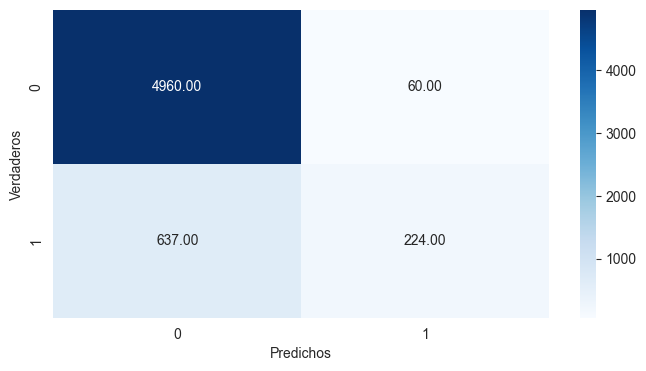

In [181]:
# Elaboramos la matriz de confusión
plt.figure(figsize=(8, 4))
confusion_matrix(y_test, y_pred)
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='.2f', cmap="Blues")
plt.ylabel('Verdaderos')
plt.xlabel('Predichos');

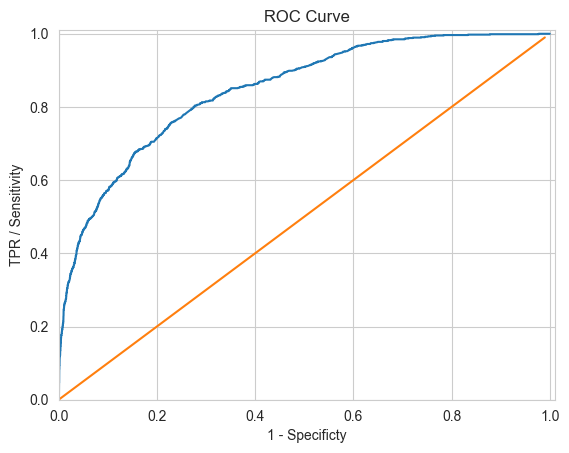

In [182]:
y_pred_proba = gridcv.predict_proba(X_test)

fpr_log,tpr_log,thr_log = roc_curve(y_test, y_pred_proba[:,1])

df_roc = pd.DataFrame(dict(fpr=fpr_log, tpr=tpr_log, thr = thr_log))

plt.axis([0, 1.01, 0, 1.01])
plt.xlabel('1 - Specificty')
plt.ylabel('TPR / Sensitivity')
plt.title('ROC Curve')
plt.plot(df_roc['fpr'],df_roc['tpr'])
plt.plot(np.arange(0,1, step =0.01), np.arange(0,1, step =0.01))
plt.show()

# Balanceo de clases

## Under sampling

In [183]:
from imblearn.under_sampling import RandomUnderSampler

undersampler=RandomUnderSampler(sampling_strategy='majority');

X_train_us,y_train_us=undersampler.fit_resample(X_train,y_train);

In [185]:
# Vamos a optimizar únicamente usando seleccion de features con RFE

#Instanciamos el modelo
rf = RandomForestClassifier(random_state= 42)


# Pipeline completo  
pipe = Pipeline([
  ("preprocessor", preprocessor),
  ('feature_selection', RFE(estimator=gb, step = 1)),
  ('classifier', rf)])

param_grid = [
  # Gradient Boosting con RFE, probando features_to_select:
  # XGBoost con RFE, probando features_to_select:
  {'classifier': [rf],
   'preprocessor__num__scaler': [MinMaxScaler()],
   'feature_selection': [RFE(estimator=gb, step = 1)],
   'feature_selection__n_features_to_select' : np.arange(1,25),
   'classifier__class_weight': [gridcv_rf.best_params_['classifier__class_weight']], 
   'classifier__max_features': [gridcv_rf.best_params_['classifier__max_features']], 
   'classifier__max_depth':[gridcv_rf.best_params_['classifier__max_depth']],
   'classifier__n_estimators': [gridcv_rf.best_params_['classifier__n_estimators']]}
]


kf = KFold(n_splits=3, shuffle = True)

# Grid Search con Cross validation
gridcv_us = GridSearchCV(pipe, param_grid, cv=kf, verbose=1, n_jobs = 7)

gridcv_us.fit(X_train_us, y_train_us)
gridcv_us.best_estimator_

Fitting 3 folds for each of 24 candidates, totalling 72 fits


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   MinMaxScaler())]),
                                                  ['household_size',
                                                   'age_of_respondent']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['country', 'location_type',
                                                   'cellphone_access',
                                                   'gender_of_respondent',
                                                   'relationship_with_head',
                                                   'marital_status',
                                                   'education_level',
                                                   'job_type'])])),
                ('feature_selection',
                 RFE(estimator=GradientBoostingClassifier(random_state=42),
                     n_features_to_select=19)),
                ('classifier',
                 RandomForestClassifier(max_depth=7, random_state=42))])

In [186]:
# Prediccion y scores del modelo
y_pred_us = gridcv_us.predict(X_test)

gridcv_us_acc = metrics.accuracy_score(y_test, y_pred_us)
gridcv_us_prec = metrics.precision_score(y_test, y_pred_us)
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_us).ravel()
specificity_us = tn / (tn+fp)

model_us_scores = pd.DataFrame({'accuracy': gridcv_us_acc,
    'precision':gridcv_us_prec,
    'specificity': specificity_us},
    index=[0]
    )

# guardamos en archivos csv para utilizarlos en la app de streamlit
model_us_scores.to_csv('model_us_scores.csv')

print(f'Accuracy score: {gridcv_us_acc}')
print(f'Precision score: {gridcv_us_prec}')
print(f'Scpecificity score: {specificity_us}')

Accuracy score: 0.7981635776228533
Precision score: 0.39524421593830333
Scpecificity score: 0.8125498007968127


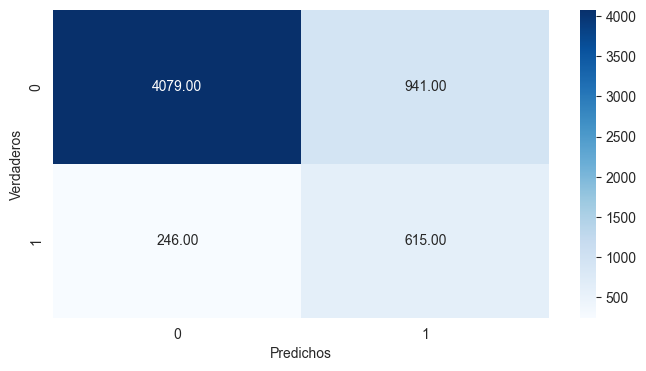

In [187]:
# Elaboramos la matriz de confusión
plt.figure(figsize=(8, 4))
confusion_matrix(y_test, y_pred_us)
sns.heatmap(confusion_matrix(y_test, y_pred_us), annot=True, fmt='.2f', cmap="Blues")
plt.ylabel('Verdaderos')
plt.xlabel('Predichos');

## Over sampling

In [188]:
from imblearn.over_sampling import RandomOverSampler

oversampler=RandomOverSampler(sampling_strategy='minority');

X_train_os,y_train_os=oversampler.fit_resample(X_train,y_train);

In [189]:
# Instanciamos el clasificador que mejor performance tuvo: Gradient Boosting Classifier y XGB. 
# Vamos a optimizar únicamente usando seleccion de features con RFE

#Instanciamos el modelo
rf = RandomForestClassifier(random_state= 42)


# Pipeline completo  
pipe = Pipeline([
  ("preprocessor", preprocessor),
  ('feature_selection', RFE(estimator=gb, step = 1)),
  ('classifier', rf)])

param_grid = [
  # Gradient Boosting con RFE, probando features_to_select:
  # XGBoost con RFE, probando features_to_select:
  {'classifier': [rf],
   'preprocessor__num__scaler': [MinMaxScaler()],
   'feature_selection': [RFE(estimator=gb, step = 1)],
   'feature_selection__n_features_to_select' : np.arange(1,25),
   'classifier__class_weight': [gridcv_rf.best_params_['classifier__class_weight']], 
   'classifier__max_features': [gridcv_rf.best_params_['classifier__max_features']], 
   'classifier__max_depth':[gridcv_rf.best_params_['classifier__max_depth']],
   'classifier__n_estimators': [gridcv_rf.best_params_['classifier__n_estimators']]}
]


kf = KFold(n_splits=3, shuffle = True)

# Grid Search con Cross validation
gridcv_os = GridSearchCV(pipe, param_grid, cv=kf, verbose=1, n_jobs = 7)

gridcv_os.fit(X_train_os, y_train_os)
gridcv_os.best_estimator_

Fitting 3 folds for each of 24 candidates, totalling 72 fits


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   MinMaxScaler())]),
                                                  ['household_size',
                                                   'age_of_respondent']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['country', 'location_type',
                                                   'cellphone_access',
                                                   'gender_of_respondent',
                                                   'relationship_with_head',
                                                   'marital_status',
                                                   'education_level',
                                                   'job_type'])])),
                ('feature_selection',
                 RFE(estimator=GradientBoostingClassifier(random_state=42),
                     n_features_to_select=23)),
                ('classifier',
                 RandomForestClassifier(max_depth=7, random_state=42))])

In [190]:
# Prediccion y scores del modelo
y_pred_os = gridcv_os.predict(X_test)

gridcv_os_acc = metrics.accuracy_score(y_test, y_pred_os)
gridcv_os_prec = metrics.precision_score(y_test, y_pred_os)
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_os).ravel()
specificity_os = tn / (tn+fp)

model_os_scores = pd.DataFrame({'accuracy': gridcv_os_acc,
    'precision':gridcv_os_prec,
    'specificity': specificity_os},
    index=[0]
    )

# guardamos en archivos csv para utilizarlos en la app de streamlit
model_os_scores.to_csv('model_os_scores.csv')

print(f'Accuracy score: {gridcv_os_acc}')
print(f'Precision score: {gridcv_os_prec}')
print(f'Scpecificity score: {specificity_os}')


Accuracy score: 0.800204046930794
Precision score: 0.3992297817715019
Scpecificity score: 0.8135458167330677


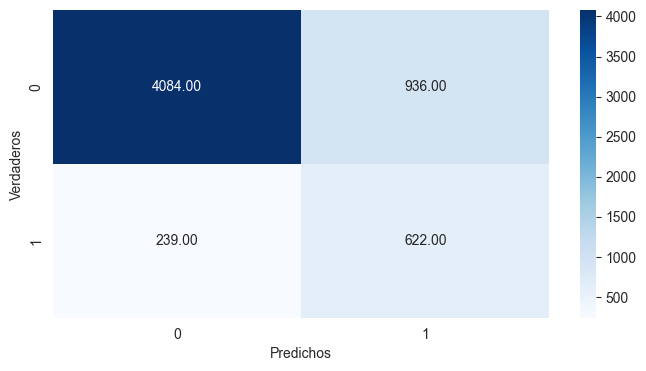

In [191]:
# Elaboramos la matriz de confusión
plt.figure(figsize=(8, 4))
confusion_matrix(y_test, y_pred_os)
sns.heatmap(confusion_matrix(y_test, y_pred_os), annot=True, fmt='.2f', cmap="Blues")
plt.ylabel('Verdaderos')
plt.xlabel('Predichos');

# Pickle

In [192]:
# vemos que la performance del modelo empeora usando las técnicas de resampling, por eso mantenemos el modelo orginal
with open('financial_inclusion.pkl', 'wb') as clf_inclusion:
    pickle.dump(gridcv, clf_inclusion)

In [193]:
with open('./financial_inclusion.pkl', 'rb') as clf_inclusion:
        modelo_inclusion = pickle.load(clf_inclusion)

In [194]:
modelo_inclusion.best_score_

0.8861304766763022

In [195]:
X_test.head()

,country,location_type,cellphone_access,household_size,age_of_respondent,gender_of_respondent,relationship_with_head,marital_status,education_level,job_type
14337,Rwanda,Rural,Yes,3,22,Female,Spouse,Married/Living together,Primary education,Remittance Dependent
19692,Tanzania,Urban,No,3,76,Female,Spouse,Single/Never Married,No formal education,Informally employed
15170,Tanzania,Urban,Yes,2,33,Female,Spouse,Single/Never Married,Primary education,Informally employed
12060,Rwanda,Rural,Yes,4,33,Male,Spouse,Married/Living together,Primary education,Farming and Fishing
19591,Tanzania,Rural,No,10,74,Female,Spouse,Single/Never Married,No formal education,Remittance Dependent


In [196]:
# probamos datos para ver si el modelo predice
input_data =[['Uganda', 'Urban','Yes', 3, 45, 'Male', 'Head of Household', 'Divorced/Seperated', 'Tertiary education', 'Self employed']]
input_test = pd.DataFrame(input_data, columns=X_test.columns)
input_test

,country,location_type,cellphone_access,household_size,age_of_respondent,gender_of_respondent,relationship_with_head,marital_status,education_level,job_type
0,Uganda,Urban,Yes,3,45,Male,Head of Household,Divorced/Seperated,Tertiary education,Self employed


In [197]:
modelo_inclusion.predict(input_test)

array([1.])

# Deploy del modelo

Para el deploy del modelo usamos Streamlit (https://streamlit.io/), un “framework” de Python de código abierto que permite de manera sencilla e integrada desarrollar aplicaciones gracias a la interacción con otras librerías.

El link a la app del modelo es el siguiente: https://adilelle1-financial-inclusion-africa-model-q24ypc.streamlit.app/

# Conclusiones finales

Como se dijo anteriormente, existe una preocupación global por el desarrollo de la inclusión financiera, con el fin de promover el crecimiento económico a largo plazo y reducir los niveles de pobreza existentes. Sin embargo, y a pesar de los relativos avances, África continúa siendo el continente más pobre del mundo, con un gran porcentaje de la población en situación de desnutrición. 
El continente africano se enfrenta a graves problemas y grandes desafíos en su desarrollo, lo que implica un deterioro significativo en su economía. El presente trabajo, aborda esta problemática, aportando información respecto a la bancarización de su población, y a cómo determinar si una persona tiene acceso a una cuenta bancaria. Consideramos que este tipo de análisis y proyectos, pueden colaborar a dar cuenta del tamaño de los riesgos posibles, debidos a la escasez presente en la inclusión financiera del continente; con el fin de promover la construcción de nuevas soluciones que potencien em efecto a la economía africana. 
Hemos experimentado con varios modelos de aprendizaje automático, para estudiar las características de las personas y predecir si son usuarios bancarizados. Aplicamos diferentes algoritmos clasificadores en aprendizaje automático, y a pesar de que no obtuvimos un modelo que prediga con gran porcentaje de acierto, descubrimos que el mejor resultado se obtuvo utilizando el modelo XG Boost o el Gradient Boosting, con una Accuracy Score de 88,86% aproximadamente, en un conjunto de datos públicos (Zindi) recopilados de diferentes bancos africanos.

# Referencias

Financial Inclusion in Africa. Zindi. 2021. Avaliable in: \<https://zindi.africa/competitions/financial-inclusion-in-africa >.

World Development Indicators. The World Bank Group. Dec 31th, 2020. Available in: \<https://datatopics.worldbank.org/world-development-indicators/ >.